# Analyzing prevalent COVID-19 datasets to generate insights on the spread of COVID-19 over time using heatmaps, charts, graphs, time series and other tools.

##### Thanya Ramanathan and Anirudh Balan
---

In [1]:
# Importing the libraries

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
# Reading the datasets

In [4]:
df1 = pd.read_csv('/Users/test/Desktop/Project/basic/covid_19_india.csv')
#df2 = pd.read_csv('/Users/test/Desktop/Project/basic/StatewiseTestingDetails.csv')
df2 = pd.read_csv('/Users/test/Desktop/Project/basic/archive/covid_19_data.csv')
df3 = pd.read_csv('/Users/test/Desktop/Project/response_graphs_data_2021-01-14.csv')
df4 = pd.read_csv('/Users/test/Desktop/Project/H1N1/data.csv')
df5 = pd.read_csv('/Users/test/Desktop/Project/SARS/sars_2003_complete_dataset_clean.csv')
df6 = pd.read_csv('/Users/test/Desktop/Project/daily-covid-vaccination-doses-per-capita.csv')
df8 = pd.read_csv('/Users/test/Desktop/Project/covid-vaccine-doses-by-manufacturer.csv')

---

### Plotting the most common measures taken by different countries to prevent the spread of COVID-19

In [5]:
#using groupby() method to get all the uniques response measures and all their respective values

In [6]:
df7 = pd.DataFrame(df3.groupby('Response_measure'))

In [7]:
df7.drop(columns = [1], inplace = True)

In [8]:
df7.rename(columns = {0 : 'ResponseMeasure'}, inplace = True)

In [9]:
response_count = dict(df3['Response_measure'].value_counts())

In [10]:
import collections
response_count = collections.OrderedDict(sorted(response_count.items()))

In [11]:
counts = response_count.values()

In [12]:
# Creating a new dataframe df7 that has the response measures and the number countries that have taken that measure

In [13]:
df7['Counts'] = counts

In [14]:
# defining a function to plot big set of data

Text(0, 0.5, 'Response Measure')

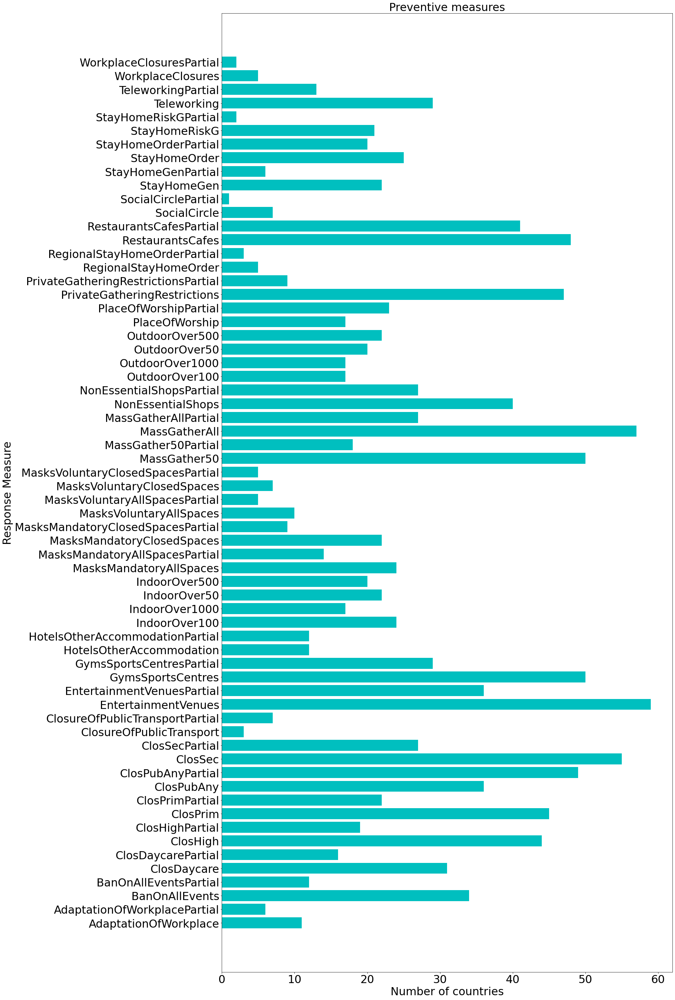

In [15]:
plt.figure(figsize=(22, 48))
plt.barh(df7['ResponseMeasure'],df7['Counts'], color ='c')
plt.title('Preventive measures', size=30)
plt.xticks(size=30)
plt.yticks(size=30)
plt.xlabel('Number of countries', size = 30)
plt.ylabel('Response Measure', size = 30)

#### The above graph displays the number of countries that have adpoted a specific method to prevent the spread of COVID-19. 

---

### COVID-19 in India

In [16]:
df1['Date'] = pd.to_datetime(df1['Date'] , format = '%d/%m/%y')

In [17]:
# Plotting the number of confirmed cases, cured patients and deaths in each state/union territory as of 09/12/2020

In [18]:
filt = df1['State/UnionTerritory'].unique()
x = df1.groupby(['State/UnionTerritory'])    
Confirmed_cases = list()
cured_cases = list()
deaths = list()
for state in filt:
    df11 = pd.DataFrame(x.get_group(state))
    Confirmed_cases.append(df11['Confirmed'].sum())
    cured_cases.append(df11['Cured'].sum())
    deaths.append(df11['Deaths'].sum())

In [19]:
#creating a dataframe that contains the total number of confirmed cases, cured cases and deaths of each state as of 09/12/2020

In [20]:
df12 = pd.DataFrame(filt)

In [21]:
df12['Totalconfirmedcases'] = Confirmed_cases
df12['Totalcuredcases'] = cured_cases
df12['Totaldeaths'] = deaths

In [22]:
df12.rename(columns = {0 : 'State/UnionTerritory'}, inplace = True)

In [23]:
# Plotting a line graph

In [24]:
plt.figure(figsize=(500, 100))
#plt.grid(color = 'k')
plt.style.use('fivethirtyeight')
plt.title('Number of cases in states', size = 250)
plt.xticks(size=200, rotation = 30)
plt.yticks(size=200)
plt.plot(df12['State/UnionTerritory'], df12['Totalconfirmedcases'], 'g',label = 'Confirmed Cases', linewidth = 20)
plt.plot(df12['State/UnionTerritory'], df12['Totalcuredcases'],'r',label = 'Cured Cases',linewidth = 20)
plt.plot(df12['State/UnionTerritory'], df12['Totaldeaths'],'c',label = 'Deaths',linewidth = 20, linestyle = '-.')
plt.xlabel('State/Union Territory', size = 200)
plt.ylabel('Number of cases', size = 200)
plt.legend(prop={'size': 200})

#### We can infer from the above graph that the most number of confirmed cases can be seen in Maharashtra, Tamil Nadu and Karnataka.

In [25]:
# Plotting the number of confirmed cases with respect to the date

In [26]:
df1.set_index('Date', inplace = True)

In [27]:
Y = df1.resample('D').agg({'Cured':'sum', 'Deaths':'sum', 'Confirmed':'sum'})

In [28]:
Y1 = Y.reset_index()

Text(0, 0.5, 'Number of cases')

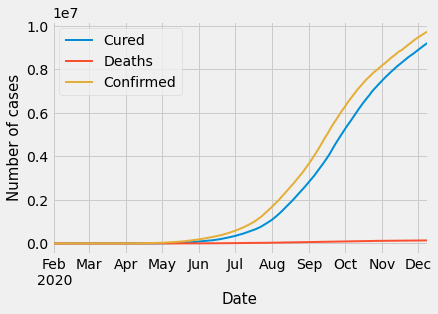

In [29]:
Y.plot(linewidth = 2)
plt.xlabel('Date', size = 15)
plt.ylabel('Number of cases', size = 15)

Text(0, 0.5, 'Number of cases')

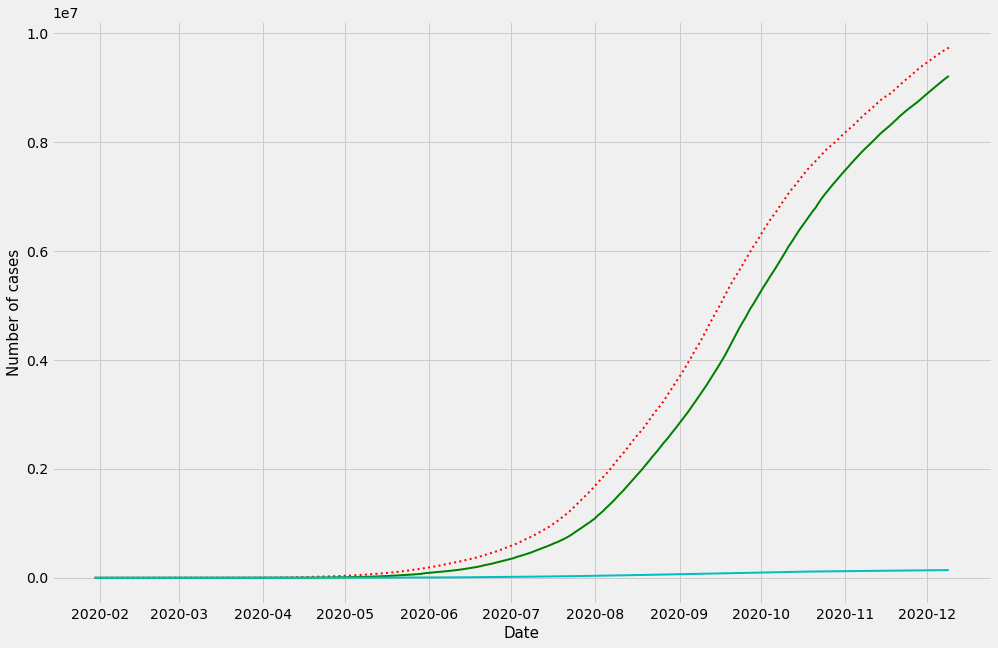

In [30]:
plt.figure(figsize = (15,10))

plt.plot_date(Y1['Date'],Y1['Confirmed'],'r', linestyle = ':', linewidth = 2)
plt.plot_date(Y1['Date'],Y1['Cured'],'g', linestyle = 'solid', linewidth = 2)
plt.plot_date(Y1['Date'],Y1['Deaths'],'c', linestyle = '-', linewidth = 2)

plt.xlabel('Date', size = 15)
plt.ylabel('Number of cases', size = 15)

#### The number of cases see a steep rise from June 2020 as per the above line graph

---

### Worldwide COVID-19 data

In [31]:
df2.drop(columns = ['Province/State', 'Last Update'], inplace = True)

In [32]:
df2['ObservationDate'] = pd.to_datetime(df2['ObservationDate'] , format = '%m/%d/%Y')

In [33]:
# Plotting the number of confirmed cases, cured patients and deaths in each country as of 19/01/2021

In [34]:
fil = df2['Country/Region'].unique()
r = df2.groupby(['Country/Region'])    
confirmed = list()
recovered = list()
death = list()
for country in fil:
    df21 = pd.DataFrame(r.get_group(country))
    confirmed.append(df21['Confirmed'].sum())
    recovered.append(df21['Recovered'].sum())
    death.append(df21['Deaths'].sum())

In [35]:
# Creating a dataframe that contains the total number of confirmed cases, cured cases and deaths of each state as of 19/01/2021

In [36]:
df22 = pd.DataFrame(fil)

In [37]:
df22['Confirmed'] = confirmed
df22['Recovered'] = recovered
df22['Deaths'] = death

In [38]:
df22.rename(columns = {0 : 'Country/Region'}, inplace = True)

In [39]:
df22 = df22.sort_values(by = ['Confirmed','Recovered','Deaths'], ascending = False).head(10)

In [40]:
# Plotting a line graph

In [41]:
plt.figure(figsize=(500, 100))
#plt.grid(color = 'k')
plt.style.use('fivethirtyeight')
plt.title('Most affected countires', size = 250)
plt.xticks(size=200, rotation = 30)
plt.yticks(size=200)
plt.plot(df22['Country/Region'], df22['Confirmed'], 'g',label = 'Confirmed', linewidth = 20, linestyle = '-.')
plt.plot(df22['Country/Region'], df22['Recovered'],'r',label = 'Recovered',linewidth = 20)
plt.plot(df22['Country/Region'], df22['Deaths'],'k',label = 'Deaths',linewidth = 20)
plt.xlabel('Country/Region', size = 200)
plt.ylabel('Number of cases', size = 200)
plt.legend(prop={'size': 200})

#### We can infer from the line graph that United States and India have had the most number of COVID-19 cases

In [42]:
# Plotting the number of confirmed cases with respect to the date

In [43]:
df2.set_index('ObservationDate', inplace = True)

In [44]:
X = df2.resample('W').agg({'Recovered':'sum', 'Deaths':'sum', 'Confirmed':'sum'})

Text(0, 0.5, 'Number of cases')

<Figure size 1080x720 with 0 Axes>

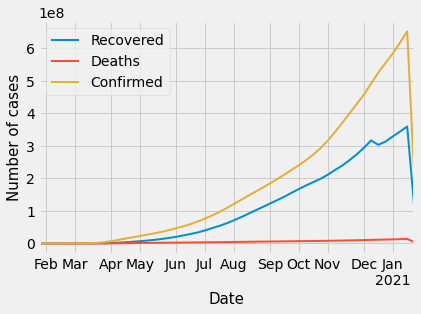

In [45]:
plt.figure(figsize = (15,10))
X.plot(linewidth = 2)
plt.xlabel('Date', size = 15)
plt.ylabel('Number of cases', size = 15)

In [46]:
X1 = X.reset_index()

Text(0, 0.5, 'Number of cases')

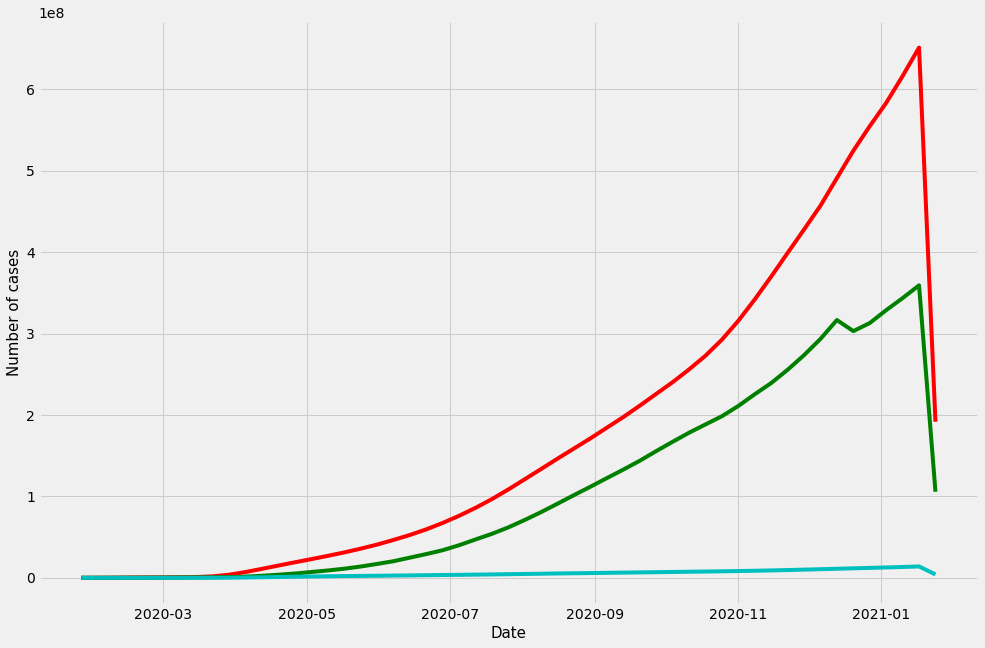

In [47]:
plt.figure(figsize = (15,10))

plt.plot_date(X1['ObservationDate'],X1['Confirmed'],'r', linestyle = 'solid')
plt.plot_date(X1['ObservationDate'],X1['Recovered'],'g', linestyle = 'solid')
plt.plot_date(X1['ObservationDate'],X1['Deaths'],'c', linestyle = '-')

plt.xlabel('Date', size = 15)
plt.ylabel('Number of cases', size = 15)

#### There has been a major drop in the number of cases after January 2021 as per the above representation of the data

---

### Comparison with other pandemics

In [48]:
df4.drop(columns = ['Link'], inplace = True)

In [49]:
x = df4.groupby('Country')
y = x.max()
y.sort_values(by = 'Cumulative no. of cases', ascending = False, inplace=True)

In [50]:
q = df5.groupby('Country')
e = q.max()
e.sort_values(by = 'Cumulative number of case(s)', ascending = False, inplace=True)

In [51]:
df4['Date'] = pd.to_datetime(df4['Date'] , format = ('%Y/%m/%d'))
df4.set_index('Date', inplace = True)

In [52]:
t = df4.resample('M').agg({'Cumulative no. of cases':'sum', 'Cumulative no. of deaths':'sum'})

In [53]:
df5['Date'] = pd.to_datetime(df5['Date'] , format = ('%Y/%m/%d'))
df5.set_index('Date', inplace = True)

In [54]:
klk = df5.resample('M').agg({'Cumulative number of case(s)':'sum', 'Number of deaths':'sum'})

In [55]:
sars  = klk.reset_index()

In [56]:
h1n1 = t.reset_index()

In [60]:
Z = df2.resample('D').agg({'Recovered':'sum', 'Deaths':'sum', 'Confirmed':'sum'})

In [61]:
Z.resample('M').agg({'Recovered':'sum', 'Deaths':'sum', 'Confirmed':'sum'})
covid = Z.reset_index()

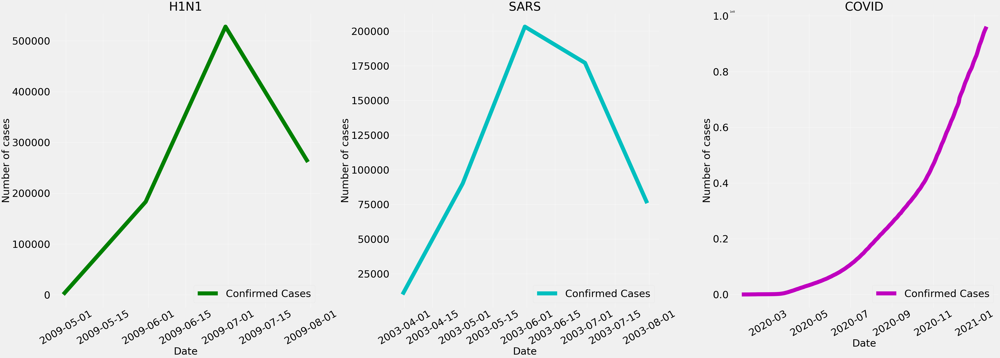

In [62]:
plt.figure(figsize=(70, 25))
plt.style.use('fivethirtyeight')

plt.subplot(131)
plt.title('H1N1', size = 60)
plt.xticks(size=50, rotation = 30)
plt.yticks(size=50)
plt.xlabel('Date', size = 50)
plt.ylabel('Number of cases', size = 50)
plt.tight_layout()
plt.grid(color = 'w')
plt.plot(h1n1['Date'], h1n1['Cumulative no. of cases'], 'g',label = 'Confirmed Cases', linewidth = 20)
plt.legend(prop={'size': 50}, loc = 'lower right')



plt.subplot(132)
plt.xticks(size=50, rotation = 30)
plt.yticks(size=50)
plt.title('SARS', size = 60)
plt.xlabel('Date', size = 50)
plt.ylabel('Number of cases', size = 50)
plt.tight_layout()
plt.grid(color = 'w')
plt.plot(sars['Date'], sars['Cumulative number of case(s)'], 'c',label = 'Confirmed Cases', linewidth = 20)
plt.legend(prop={'size': 50}, loc = 'lower right')


plt.subplot(133)
plt.xticks(size=50, rotation = 30)
plt.yticks(size=50)
plt.xlabel('Date', size = 50)
plt.ylabel('Number of cases', size = 50)
plt.title('COVID', size = 60)
plt.tight_layout()
plt.grid(color = 'w')
plt.plot(covid['ObservationDate'], covid['Confirmed'], 'm',label = 'Confirmed Cases', linewidth = 20)
plt.legend(prop={'size': 50}, loc = 'lower right')

#### The above graphs show the variation of different pandemics with time. While H1N1 and SARS show a decline in the number of cases after the first 3-4 months COVID-19 have been continuously increasing.

---

### COVID-19 vaccination

In [ ]:
df6['Date'] = pd.to_datetime(df6['Date'] , format = '%Y-%m-%d')

In [ ]:
# Creating a dataframe that contains the total number of vaccines in some contries as of 9/02/2021

In [ ]:
filtr = df6['Entity'].unique()
A = df6.groupby(['Entity'])    
totalvaccines = list()
for c in filtr:
    df61 = pd.DataFrame(A.get_group(c))
    totalvaccines.append(df61['new_vaccinations_smoothed_per_million'].sum())

In [ ]:
df62 = pd.DataFrame(filtr)

In [ ]:
df62['Total no. of vaccines administered'] = totalvaccines

In [ ]:
df62.rename(columns = {0:'Entity'}, inplace = True)

In [ ]:
plt.figure(figsize=(22, 50))
plt.barh(df62['Entity'],df62['Total no. of vaccines administered'], color ='g')
plt.title('Vaccines Administered', size=30)
plt.xticks(size=30)
plt.yticks(size=30)

plt.ylabel('Country/Entity', size = 30)
plt.xlabel('Number of vaccines administered', size = 30)

#### Gibraltar has the most number of people vaccinated per capita

In [ ]:
# Plotting the number of vaccines administered with respect to the date

In [ ]:
df6.set_index('Date', inplace = True)

In [ ]:
Z = df6.resample('D').agg({'new_vaccinations_smoothed_per_million':'sum'})

In [ ]:
Z1 = Z.reset_index()

In [ ]:
plt.figure(figsize = (15,10))
plt.plot_date(Z1['Date'],Z1['new_vaccinations_smoothed_per_million'],'r', linestyle = '-', linewidth = 3)

plt.ylabel('Date', size = 15)
plt.xlabel('Number of vaccines administered', size = 15)

#### The number of vaccines administered have been rising since December 2020 but the graph shows steep drop after the first week of February 2021

In [ ]:
# Plotting the different vaccines used in different countries

In [ ]:
vaccinefil = df8['Entity'].unique()
V = df8.groupby(['Entity'])    
moderna = list()
Oxford_AstraZeneca = list()
Pfizer_BioNTech = list()
Sinovac = list()

for entity in vaccinefil:
    df81 = pd.DataFrame(V.get_group(entity))
    moderna.append(df81['Moderna'].sum())
    Oxford_AstraZeneca.append(df81['Oxford/AstraZeneca'].sum())
    Pfizer_BioNTech.append(df81['Pfizer/BioNTech'].sum())
    Sinovac.append(df81['Sinovac'].sum())

In [ ]:
df82 = pd.DataFrame(vaccinefil)

In [ ]:
df82['Moderna'] = moderna
df82['Oxford/AstraZeneca'] = Oxford_AstraZeneca
df82['Pfizer/BioNTech'] = Pfizer_BioNTech
df82['Sinovac'] = Sinovac

In [ ]:
plt.figure(figsize = (10,10))
plt.title('Moderna')
plt.pie(df82['Moderna'])
plt.legend(labels = df82[0], loc = 3)

#### United States of America is the highest consumer of Moderna vaccine

In [ ]:
plt.figure(figsize = (10,10))
plt.title('Oxford/AstraZeneca')
plt.pie(df82['Oxford/AstraZeneca'])
plt.legend(labels = df82[0], loc = 3)

#### Lithuania is the highest consumer of Oxford/Astra Zenaca vaccine

In [ ]:
plt.figure(figsize = (10,10))
plt.title('Pfizer/BioNTech')
plt.pie(df82['Pfizer/BioNTech'])
plt.legend(labels = df82[0], loc = 3)

#### United States of America is the highest consumer of Pfizer vaccine

In [ ]:
plt.figure(figsize = (10,10))
plt.title('Sinovac')
plt.pie(df82['Sinovac'])
plt.legend(labels = df82[0], loc = 3)

#### Chile is the only country that has used Sinovac

In [ ]:
plt.figure(figsize = (20,10))
plt.plot([], [], color ='r',  
         label ='Moderna') 
plt.plot([], [], color ='g', 
         label ='Oxford/AstraZeneca') 
plt.plot([], [], color ='c', 
         label ='Pfizer/BioNTech') 
plt.stackplot(vaccinefil, moderna, Oxford_AstraZeneca,Pfizer_BioNTech, colors = ['r','g','c'])
plt.legend()
plt.title('Vaccines preffered in different countries') 
plt.xlabel('Country') 
plt.ylabel('Number of Vaccines') 

#### Pfizer seems to be the most preferred vaccine followed by Moderna according to the plot

---